In [1]:
# Standard imports
import os
from pathlib import Path

import numpy as np
import xarray as xr
from sklearn.decomposition import PCA
from scipy.stats import skew, kurtosis, probplot

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from regionmask.defined_regions import ar6
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

import warnings
warnings.filterwarnings('ignore')

from meteor import MeteorInterface, Cmip6MeteorDataGetter, geo_data_utils
from meteor.noise_model.ae_varx import AEVARXNoiseModel

print("✅ Imports complete")

✅ Imports complete


In [2]:
SEED = 42
RNG = np.random.default_rng(SEED)

MODEL = 'NorESM2-MM'
VARIABLES = ['tas', 'pr']
N_REALIZATIONS_SMALL = 10
N_REALIZATIONS = 300
SCENARIO = 'ssp245'
START_YEAR = 1850
END_YEAR = 2100

regions = ['NEU', 'NSA', 'EAS']
region_names = {
    'NEU': 'Northern Europe',
    'NSA': 'Northern South America',
    'EAS': 'East Asia'
}

cities = {
    'Oslo': {'lat': 59.9, 'lon': 10.8},
    'Delhi': {'lat': 28.6, 'lon': 77.2},
    'Cairo': {'lat': 30.0, 'lon': 31.2},
    'Beijing': {'lat': 39.9, 'lon': 116.4}
}

timeseries = ['global']
timeseries += [f'regional:{r}' for r in regions]
timeseries += [f"point:{cities[c]['lat']},{cities[c]['lon']}" for c in cities.keys()]

print(f"Model: {MODEL}")
print(f"Variables: {VARIABLES}")
print(f"Spatial aggregations: {len(timeseries)}")
for ts in timeseries:
    print(f"  {ts}")

Model: NorESM2-MM
Variables: ['tas', 'pr']
Spatial aggregations: 8
  global
  regional:NEU
  regional:NSA
  regional:EAS
  point:59.9,10.8
  point:28.6,77.2
  point:30.0,31.2
  point:39.9,116.4


## The full training data

In [3]:
data_getter = Cmip6MeteorDataGetter(
    exps=["piControl", "historical", "ssp245", "ssp126", "ssp585"],
    flds=VARIABLES,
    dbe=['CMIP', 'CMIP', 'ScenarioMIP', 'ScenarioMIP', 'ScenarioMIP'],
    enable_cache=True
)

cmip6_data_raw = data_getter.make_meteor_training_data_composite(
    ["historical", "ssp245"], MODEL, monthly=True
)
picontrol_data = data_getter.make_meteor_training_data(
    "piControl", MODEL, monthly=True
)

# Build anomaly time series (tas)
cmip6_timeseries = {}
cmip6_point_data = {}

# Global
cmip6_global_abs = geo_data_utils.global_mean(cmip6_data_raw['tas'])
picontrol_global = geo_data_utils.global_mean(picontrol_data['tas'])
picontrol_baseline = picontrol_global.mean()
cmip6_timeseries['global'] = cmip6_global_abs - picontrol_baseline

# Regions
for region in regions:
    cmip6_reg_abs = geo_data_utils.regional_mean(cmip6_data_raw['tas'], region)
    picontrol_reg = geo_data_utils.regional_mean(picontrol_data['tas'], region)
    cmip6_timeseries[f'regional:{region}'] = cmip6_reg_abs - picontrol_reg.mean()

# Points
for city_name, coords in cities.items():
    key = f"point:{coords['lat']},{coords['lon']}"
    cmip6_pt = geo_data_utils.extract_point(cmip6_data_raw['tas'], coords['lat'], coords['lon'])
    picontrol_pt = geo_data_utils.extract_point(picontrol_data['tas'], coords['lat'], coords['lon'])
    cmip6_point_data[key] = cmip6_pt - picontrol_pt.mean()

print(f"CMIP6 tas shape: {cmip6_data_raw['tas'].shape}")
print(f"Point locations loaded: {len(cmip6_point_data)}")

CMIP6 tas shape: (1, 3012, 192, 288)
Point locations loaded: 4


## Getting `X_ae` (the actual AE training data)

The AE does not train on raw temperature/precipitation; it trains on *seasonal-cycle-removed anomalies*.
The preprocessing pipeline inside `AEVARXNoiseModel.fit()` is:
1. Compute a smoothed global-mean temperature trajectory `t_glob`
2. Fit a harmonic seasonal-cycle model to `(time, t_glob, Y)`
3. Subtract the seasonal cycle → anomalies
4. Call `reshape_anomalies(anomalies, data_type)` → `X_ae`  (shape `(n_time, n_lat × n_lon)` for `data_type='mlp'`)

`AEVARXNoiseModel.prepare_training_data_for_AE()` is a **static method** that runs exactly these steps and returns `X_ae`, without fitting the AE or the VARX model.  Because it is a static method it can be called directly on the class — no model instance needed:

```python
X_ae = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data, variable_name="tas",
    picontrol_baseline=picontrol_baseline,
    data_type="mlp",   # 'mlp' → (n_time, n_lat*n_lon)  |  'conv' → (n_time, 1, n_lat, n_lon)
)
```
## Investigating `X_ae`
The anomalies are supposed to have the seasonal cycle removed. There are however many other modes of variability in the earth system. To understand what our AE is actually having to model we will have a look at the `X_ae`s - starting with the fields used by convolutional AE's (even though we will model it later) as it is much more inuitive to see if the `SeasonalModel` is working correctly. We will extract 3 random samples from each month to see.

## Helper functions

In [4]:
def plot_sample_on_ax(
    ax,
    sample_2d,
    extent,
    title="",
    vmin=None,
    vmax=None,
    cmap="coolwarm",
    add_overlays=True,
):
    """
    Plot a single 2D sample on a given Cartopy axis.

    Parameters
    ----------
    ax : cartopy.mpl.geoaxes.GeoAxesSubplot
        Target axis with a geographic projection.
    sample_2d : np.ndarray
        2D array (lat, lon).
    extent : list[float]
        [lon_min, lon_max, lat_min, lat_max].
    title : str
        Axis title.
    vmin, vmax : float or None
        Color limits for imshow.
    cmap : str
        Matplotlib colormap.
    add_overlays : bool
        If True, draw AR6 regions, lat bands, cities.
    """
    im = ax.imshow(
        sample_2d,
        origin="lower",
        transform=ccrs.PlateCarree(),
        extent=extent,
        vmin=vmin,
        vmax=vmax,
        cmap=cmap,
    )
    ax.set_title(title)

    if add_overlays:
        # AR6 regions
        ar6.all[list(region_names.keys())].plot(
            ax=ax,
            add_ocean=False,
            text_kws={"fontsize": 6, "fontweight": "bold"},
            label="abbrev",
        )

        # Latitude band lines
        for label, b in lat_bands.items():
            lat_val = b["actual_lat"]
            ax.plot(
                [-179.9, 179.9],
                [lat_val, lat_val],
                transform=ccrs.PlateCarree(),
                color=b["color"],
                lw=1.4,
                ls=b["ls"],
                alpha=0.85,
                label=f"{label}  (rows {b['flat_start']}–{b['flat_end']})",
            )

        # City markers
        city_colors = ["white", "yellow", "lime", "cyan"]
        for (cname, c), marker_color in zip(city_flat.items(), city_colors):
            ax.scatter(
                c["actual_lon"],
                c["actual_lat"],
                transform=ccrs.PlateCarree(),
                s=60,
                marker="*",
                color=marker_color,
                edgecolors="black",
                lw=0.5,
                zorder=5,
                label=f"{cname}  (idx {c['flat_idx']})",
            )
            ax.text(
                c["actual_lon"] + 3,
                c["actual_lat"] + 3,
                cname,
                transform=ccrs.PlateCarree(),
                fontsize=7,
                color="white",
                fontweight="bold",
                clip_on=True,
            )

    return im


In [5]:
def plot_monthly_samples_grid(
    X,
    random_indices,
    extent,
    month_names=None,
    cmap="coolwarm",
    suptitle="X_ae samples by month",
):
    """
    Plot 3 random samples per month in a (months x samples) grid.

    Parameters
    ----------
    X : np.ndarray
        Array of shape (n_samples, 1, n_lat, n_lon).
    random_indices : dict[int, np.ndarray]
        Keys are months 1..12, values are arrays of sample indices (e.g. size 3).
    extent : list[float]
        [lon_min, lon_max, lat_min, lat_max].
    month_names : list[str] or None
        Optional list of 12 month names for row labels.
    cmap : str
        Colormap.
    suptitle : str
        Figure title.
    """
    # Sort months and determine grid size
    months = sorted(random_indices.keys())
    n_months = len(months)
    # assume all months have same number of samples
    n_samples_per_month = len(next(iter(random_indices.values())))

    # Collect all selected samples for global vmin/vmax
    all_vals = []
    for m in months:
        idxs = random_indices[m]
        samples_m = X[idxs, 0, :, :]  # (k, n_lat, n_lon)
        all_vals.append(samples_m)
    all_vals = np.concatenate(all_vals, axis=0)  # (n_months*k, n_lat, n_lon)
    vmin = all_vals.min()
    vmax = all_vals.max()
    cmap_max = max(abs(vmin), abs(vmax))
    vmin, vmax = -cmap_max, cmap_max

    # Figure and grid
    fig = plt.figure(figsize=(4 * n_samples_per_month, 2.5 * n_months))
    gs = GridSpec(nrows=n_months, ncols=n_samples_per_month, figure=fig)

    last_im = None

    for row, m in enumerate(months):
        idxs = random_indices[m]
        for col, idx in enumerate(idxs):
            ax = fig.add_subplot(gs[row, col], projection=ccrs.PlateCarree())
            sample_2d = X[idx, 0, :, :]

            # Title: month + index
            if month_names is not None and 1 <= m <= len(month_names):
                month_label = month_names[m - 1]
            else:
                month_label = f"Month {m}"
            title = f"{month_label} | idx {idx}"

            last_im = plot_sample_on_ax(
                ax=ax,
                sample_2d=sample_2d,
                extent=extent,
                title=title,
                vmin=vmin,
                vmax=vmax,
                cmap=cmap,
                add_overlays=True,
            )

            # Optional: hide y-axis labels for inner columns, etc.
            if col > 0:
                ax.set_ylabel("")

    # Common colorbar
    if last_im is not None:
        cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
        cbar = fig.colorbar(last_im, cax=cbar_ax)
        cbar.set_label("Temperature Anomaly (°C)", fontsize=10)

    if suptitle:
        fig.suptitle(suptitle, fontsize=14)
    plt.tight_layout(rect=[0.0, 0.0, 0.9, 0.95])  # leave space for colorbar and title

    return fig


In [6]:
def summarize_anomaly_field_core(
    X_ae_conv,
    lats,
    lons,
    extent,
    units="°C",
    title="Anomaly statistics (core)",
    verbose=True,
):
    """
    Core diagnostic figure for an anomaly field:
      - Row 1: variance map + zonal variance
      - Row 2: skewness map + zonal skewness
      - Row 3: kurtosis map + zonal kurtosis

    Parameters
    ----------
    X_ae_conv : np.ndarray
        Anomaly field of shape (T, 1, n_lat, n_lon).
    lats, lons : 1D arrays
    extent : list[float]
        [lon_min, lon_max, lat_min, lat_max].
    units : str
        Units of anomalies.
    title : str
        Figure title.
    verbose : bool
        If True, print basic stats.

    Returns
    -------
    stats : dict
    fig : matplotlib.figure.Figure
    """
    X_2d = X_ae_conv[:, 0, :, :]
    n_t, n_lat, n_lon = X_2d.shape

    # ---- per-gridpoint stats ----
    var_map  = X_2d.var(axis=0)
    skew_map = skew(X_2d, axis=0)
    kurt_map = kurtosis(X_2d, axis=0, fisher=True)

    cos_lat = np.cos(np.deg2rad(lats))

    # zonal means
    var_by_lat  = var_map.mean(axis=1)
    skew_by_lat = skew_map.mean(axis=1)
    kurt_by_lat = kurt_map.mean(axis=1)

    # ---- figure: 3 rows x 2 cols ----
    fig = plt.figure(figsize=(14, 10))
    gs = GridSpec(
        3, 2, figure=fig,
        width_ratios=[1.2, 0.9],
        height_ratios=[1.0, 1.0, 1.0],
        wspace=0.25, hspace=0.35,
    )

    # ----- Row 1: variance -----
    ax_var_map = fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree())
    im_var = ax_var_map.imshow(
        var_map,
        origin="lower",
        aspect="auto",
        extent=extent,
        cmap="YlOrRd",
    )
    ax_var_map.add_feature(cfeature.LAND, facecolor="none", edgecolor="black", lw=0.5, zorder=10)
    plt.colorbar(im_var, ax=ax_var_map, label=f"Variance ({units}²)")
    ax_var_map.set_title("Per-gridpoint temporal variance")
    ax_var_map.set_xlabel("Longitude")
    ax_var_map.set_ylabel("Latitude")

    ax_var_lat = fig.add_subplot(gs[0, 1])
    ax_var_lat.plot(var_by_lat, lats, color="steelblue")
    ax_var_lat.axvline(0, color="k", lw=0.5)
    ax_var_lat.axhline(0, color="k", lw=0.5, ls="--")
    ax_var_lat.set_xlabel(f"Zonal mean variance ({units}²)")
    ax_var_lat.set_ylabel("Latitude (°)")
    ax_var_lat.set_title("Zonal-mean variance")

    # ----- Row 2: skewness -----
    ax_skew_map = fig.add_subplot(gs[1, 0], projection=ccrs.PlateCarree())
    skew_max = np.percentile(np.abs(skew_map[np.isfinite(skew_map)]), 99)
    im_skew = ax_skew_map.imshow(
        skew_map,
        origin="lower",
        aspect="auto",
        extent=extent,
        cmap="RdBu_r",
        vmin=-skew_max,
        vmax=skew_max,
    )
    ax_skew_map.add_feature(cfeature.LAND, facecolor="none", edgecolor="black", lw=0.5, zorder=10)
    plt.colorbar(im_skew, ax=ax_skew_map, label="Skewness")
    ax_skew_map.set_title("Skewness (0 = symmetric / Gaussian)")
    ax_skew_map.set_xlabel("Longitude")
    ax_skew_map.set_ylabel("Latitude")

    ax_skew_lat = fig.add_subplot(gs[1, 1])
    ax_skew_lat.plot(skew_by_lat, lats, color="darkorange")
    ax_skew_lat.axvline(0, color="k", lw=0.5)
    ax_skew_lat.axhline(0, color="k", lw=0.5, ls="--")
    ax_skew_lat.set_xlabel("Zonal mean skewness")
    ax_skew_lat.set_ylabel("Latitude (°)")
    ax_skew_lat.set_title("Zonal-mean skewness")

    # ----- Row 3: kurtosis -----
    ax_kurt_map = fig.add_subplot(gs[2, 0], projection=ccrs.PlateCarree())
    kurt_max = np.percentile(np.abs(kurt_map[np.isfinite(kurt_map)]), 99)
    im_kurt = ax_kurt_map.imshow(
        kurt_map,
        origin="lower",
        aspect="auto",
        extent=extent,
        cmap="PuOr_r",
        vmin=-kurt_max,
        vmax=kurt_max,
    )
    ax_kurt_map.add_feature(cfeature.LAND, facecolor="none", edgecolor="black", lw=0.5, zorder=10)
    plt.colorbar(im_kurt, ax=ax_kurt_map, label="Excess kurtosis")
    ax_kurt_map.set_title("Kurtosis (0 = Gaussian tails)")
    ax_kurt_map.set_xlabel("Longitude")
    ax_kurt_map.set_ylabel("Latitude")

    ax_kurt_lat = fig.add_subplot(gs[2, 1])
    ax_kurt_lat.plot(kurt_by_lat, lats, color="purple")
    ax_kurt_lat.axvline(0, color="k", lw=0.5)
    ax_kurt_lat.axhline(0, color="k", lw=0.5, ls="--")
    ax_kurt_lat.set_xlabel("Zonal mean excess kurtosis")
    ax_kurt_lat.set_ylabel("Latitude (°)")
    ax_kurt_lat.set_title("Zonal-mean kurtosis")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    stats = {
        "var_map": var_map,
        "skew_map": skew_map,
        "kurt_map": kurt_map,
        "var_by_lat": var_by_lat,
        "skew_by_lat": skew_by_lat,
        "kurt_by_lat": kurt_by_lat,
    }
    return stats, fig


In [7]:
def seasonal_cycle_before_after(
    X_raw,
    X_ae_conv,
    month_idx,
    region_masks=None,
    figtitle="Seasonal cycle before/after anomaly",
    units="°C",
    subplot_kwargs=None,
    show_spaghetti=True,
    hist_bins=40,
    hist_range=None,
    inset_width="30%",   # width and height relative to parent axis
    inset_height="35%",
    inset_loc="upper right",
):
    """
    Compare seasonal cycle of raw vs anomaly fields in one or more regions,
    and add a small inset histogram of anomalies for each region.

    Parameters
    ----------
    X_raw, X_ae_conv : np.ndarray
        Shape (T, 1, n_lat, n_lon).
    month_idx : 1D np.ndarray of ints in 0..11
        Length T, giving month-of-year for each time step.
    region_masks : dict[str, np.ndarray] or None
        Mapping region name -> bool mask (n_lat, n_lon).
        If None, uses a single 'Global' region.
    figtitle : str
    units : str
    subplot_kwargs : dict or None
        Extra kwargs passed to plt.subplots (e.g. nrows, ncols, figsize, sharey).
    show_spaghetti : bool
        If True, plot individual-year curves as faint background.
    hist_bins : int
        Number of bins for anomaly histograms in insets.
    hist_range : (float, float) or None
        Range for histograms; if None, inferred from all regions.
    inset_width, inset_height : str or float
        Size of inset axes (e.g. '30%' or 1.5).
    inset_loc : str
        Location string for inset_axes (e.g. 'upper right').

    Returns
    -------
    fig : matplotlib.figure.Figure
    """
    # Basic shape checks
    assert X_raw.shape == X_ae_conv.shape, "X_raw and X_ae_conv must have the same shape"
    assert X_raw.ndim == 4 and X_raw.shape[1] == 1, "Expected shape (T, 1, n_lat, n_lon)"

    Xr = X_raw[:, 0, :, :]      # (T, n_lat, n_lon)
    Xa = X_ae_conv[:, 0, :, :]  # (T, n_lat, n_lon)
    T, n_lat, n_lon = Xr.shape
    assert len(month_idx) == T, "month_idx must have length T"

    if region_masks is None:
        region_masks = {"Global": np.ones((n_lat, n_lon), dtype=bool)}

    region_masks = dict(region_masks)
    n_regions = len(region_masks)

    # Precompute all regional anomaly series to derive a common histogram range if desired
    region_anom_series = {}
    for name, mask in region_masks.items():
        Xa_region = Xa[:, mask].mean(axis=1)
        region_anom_series[name] = Xa_region

    if hist_range is None:
        all_vals = np.concatenate(list(region_anom_series.values()))
        lo, hi = np.percentile(all_vals[np.isfinite(all_vals)], [0.5, 99.5])
        pad = 0.1 * (hi - lo)
        hist_range = (lo - pad, hi + pad)

    # Set up subplots
    default_subplot_kwargs = {
        "nrows": 1,
        "ncols": n_regions,
        "figsize": (5 * n_regions, 4),
        "squeeze": False,
    }
    if subplot_kwargs is not None:
        default_subplot_kwargs.update(subplot_kwargs)

    fig, axes = plt.subplots(**default_subplot_kwargs)
    axes = axes.flatten()

    months = np.arange(12)

    for ax_idx, (name, mask) in enumerate(region_masks.items()):
        ax = axes[ax_idx]

        # 1) Regional mean time series
        Xr_region = Xr[:, mask].mean(axis=1)  # (T,)
        Xa_region = region_anom_series[name]  # (T,)

        # 2) Center raw series for plotting
        raw_offset = Xr_region.mean()

        # 3) Optional spaghetti
        if show_spaghetti:
            n_years = T // 12
            for y in range(n_years):
                slc = slice(12 * y, min(12 * (y + 1), T))
                ax.plot(
                    month_idx[slc] + 1,
                    Xr_region[slc] - raw_offset,
                    color="steelblue",
                    alpha=0.05,
                )
                ax.plot(
                    month_idx[slc] + 1,
                    Xa_region[slc],
                    color="red",
                    alpha=0.05,
                )

        # 4) Monthly climatology
        clim_raw = np.array([
            (Xr_region[month_idx == m] - raw_offset).mean()
            for m in months
        ])
        clim_anom = np.array([
            Xa_region[month_idx == m].mean()
            for m in months
        ])

        ax.plot(months + 1, clim_raw,  "-o", label="Raw (offset)",  color="steelblue", lw=1.5)
        ax.plot(months + 1, clim_anom, "-o", label="Anomaly",       color="red",       lw=1.5)

        ax.axhline(0, color="k", lw=0.7)
        # Label axes depending on position
        if ax_idx // default_subplot_kwargs["ncols"] == default_subplot_kwargs["nrows"] - 1:
            ax.set_xlabel("Month")
        if ax_idx % default_subplot_kwargs["ncols"] == 0:
            ax.set_ylabel(f"Mean {units}")
        ax.set_title(f"{name} seasonal cycle")
        ax.legend(fontsize=8, loc="upper left")

        # 5) Inset histogram of anomalies (Xa_region)
        ax_inset = inset_axes(
            ax,
            width=inset_width,
            height=inset_height,
            loc=inset_loc,
            borderpad=0.8,
        )
        ax_inset.hist(
            Xa_region,
            bins=hist_bins,
            range=hist_range,
            density=True,
            color="gray",
            alpha=0.7,
            edgecolor="none",
        )
        ax_inset.axvline(0, color="k", lw=0.5)
        ax_inset.set_title("PDF", fontsize=7)
        ax_inset.tick_params(axis="both", labelsize=6)
        # Remove y-label on inset to save space
        ax_inset.set_yticklabels([])

    # Hide unused axes if any
    for ax in axes[n_regions:]:
        ax.set_visible(False)

    fig.suptitle(figtitle, fontsize=14)
    fig.tight_layout(rect=[0, 0, 1, 0.93])
    return fig


In [8]:
def qqplot_anomaly_field(
    X_ae_conv,
    lats,
    lons,
    region_masks=None,
    n_time_sample=10000,
    title="QQ-plot of anomalies vs N(0,1)",
    subplot_kwargs=None,
):
    """
    QQ-plot(s) summarizing deviations from Gaussian for the anomaly field.

    Parameters
    ----------
    X_ae_conv : np.ndarray
        (T, 1, n_lat, n_lon).
    lats, lons : 1D arrays.
    region_masks : dict[str, np.ndarray] or None
        Optional mapping from region name -> mask (n_lat, n_lon) of bools.
        If None, uses a single global sample.
    n_time_sample : int
        Approximate number of samples to draw in total for each region.
    title : str
        Figure title.

    Returns
    -------
    fig
    """
    X_2d = X_ae_conv[:, 0, :, :]
    n_t, n_lat, n_lon = X_2d.shape

    if region_masks is None:
        region_masks = {"Global": np.ones((n_lat, n_lon), dtype=bool)}

    n_regions = len(region_masks)

    default_subplot_kwargs = {
        "nrows": 1,
        "ncols": n_regions,
        "figsize": (5 * n_regions, 4),
        "squeeze": False,
    }
    if subplot_kwargs is not None:
        default_subplot_kwargs.update(subplot_kwargs)
    fig, axes = plt.subplots(
        **default_subplot_kwargs
    )
    axes = axes.flatten()  # ensure 1D array of axes

    for ax, (name, mask) in zip(axes, region_masks.items()):
        # Extract anomalies at masked gridpoints
        data = X_2d[:, mask]  # (T, n_selected_pixels)
        data = data.reshape(-1)

        # Standardize using global mean/std within this region
        mu = np.nanmean(data)
        sigma = np.nanstd(data)
        z = (data - mu) / sigma

        # Subsample if very large
        if z.size > n_time_sample:
            idx = np.random.choice(z.size, size=n_time_sample, replace=False)
            z = z[idx]

        (osm, osr), (slope, intercept, r) = probplot(z, dist="norm")
        ax.plot(osm, osr, "o", ms=3, alpha=0.5, label=f"Data ({name})")
        ax.plot(osm, slope * osm + intercept, "r-", lw=1.5, label=f"Fit (R²≈{r**2:.2f})")
        ax.axline((0, 0), slope=1, color="k", lw=1, ls="--", label="1:1")

        ax.set_title(name)
        ax.set_xlabel("Theoretical quantiles (N(0,1))")
        ax.set_ylabel("Sample quantiles (std anomalies)")
        ax.legend(fontsize=8)

    fig.suptitle(title, fontsize=14)
    fig.tight_layout(rect=[0, 0, 1, 0.93])
    return fig


In [9]:
def summarize_anomaly_field_core(
    X_ae_conv,
    lats,
    lons,
    extent,
    month_idx,
    units="°C",
    title="Anomaly statistics (core)",
    seasons=None,
):
    """
    Core diagnostic figure for an anomaly field:
      - Row 1: variance map + seasonal variance maps (DJF/MAM/JJA/SON) + zonal variance
      - Row 2: skewness map + seasonal skewness maps + zonal skewness
      - Row 3: kurtosis map + seasonal kurtosis maps + zonal kurtosis

    Parameters
    ----------
    X_ae_conv : np.ndarray
        Anomaly field of shape (T, 1, n_lat, n_lon).
    lats, lons : 1D arrays
    extent : list[float]
        [lon_min, lon_max, lat_min, lat_max].
    month_idx : 1D np.ndarray of ints in 0..11
        Month-of-year for each time step (same length as time axis T).
    units : str
        Units of anomalies.
    title : str
        Figure title.
    seasons : dict[str, list[int]] or None
        Mapping from season name to list of month indices (0..11).
        If None, defaults to DJF/MAM/JJA/SON.

    Returns
    -------
    stats : dict
        Contains full-period and seasonal maps, plus zonal profiles.
    fig : matplotlib.figure.Figure
    """
    X_2d = X_ae_conv[:, 0, :, :]  # (T, n_lat, n_lon)
    n_t, n_lat, n_lon = X_2d.shape
    assert len(month_idx) == n_t, "month_idx must have same length as time dimension T"

    # Default seasons: months in 0..11, with DJF wrapping around year
    if seasons is None:
        seasons = {
            "DJF": [11, 0, 1],
            "MAM": [2, 3, 4],
            "JJA": [5, 6, 7],
            "SON": [8, 9, 10],
        }

    # ---- full-period per-gridpoint stats ----
    var_map  = X_2d.var(axis=0)
    skew_map = skew(X_2d, axis=0)
    kurt_map = kurtosis(X_2d, axis=0, fisher=True)

    # ---- seasonal maps ----
    var_seasonal  = {}
    skew_seasonal = {}
    kurt_seasonal = {}
    for sname, months in seasons.items():
        mask = np.isin(month_idx, months)
        if mask.sum() < 2:
            # not enough samples; fill with nan
            var_seasonal[sname]  = np.full_like(var_map, np.nan)
            skew_seasonal[sname] = np.full_like(skew_map, np.nan)
            kurt_seasonal[sname] = np.full_like(kurt_map, np.nan)
        else:
            X_s = X_2d[mask, :, :]
            var_seasonal[sname]  = X_s.var(axis=0)
            skew_seasonal[sname] = skew(X_s, axis=0)
            kurt_seasonal[sname] = kurtosis(X_s, axis=0, fisher=True)

    # ---- zonal means (full period) ----
    var_by_lat  = var_map.mean(axis=1)
    skew_by_lat = skew_map.mean(axis=1)
    kurt_by_lat = kurt_map.mean(axis=1)

    # ---- figure: 3 rows x 3 cols ----
    fig = plt.figure(figsize=(18, 10))
    gs = GridSpec(
        3, 3, figure=fig,
        width_ratios=[1.2, 1.4, 0.9],
        height_ratios=[1.0, 1.0, 1.0],
        wspace=0.25, hspace=0.35,
    )

    # Utility to create seasonal subpanels in the middle column
    def make_season_grid(row_idx):
        gs_season = GridSpecFromSubplotSpec(
            2, 2,
            subplot_spec=gs[row_idx, 1],
            wspace=0.1, hspace=0.15,
        )
        return [
            fig.add_subplot(gs_season[0, 0], projection=ccrs.PlateCarree()),
            fig.add_subplot(gs_season[0, 1], projection=ccrs.PlateCarree()),
            fig.add_subplot(gs_season[1, 0], projection=ccrs.PlateCarree()),
            fig.add_subplot(gs_season[1, 1], projection=ccrs.PlateCarree()),
        ]

    # Helper to set common map cosmetics
    def style_map_ax(ax):
        ax.add_feature(
            cfeature.LAND,
            facecolor="none",
            edgecolor="black",
            lw=0.5,
            zorder=10,
        )
        ax.set_extent(extent, crs=ccrs.PlateCarree())
        ax.coastlines(lw=0.5)

    # ORDER OF SEASONS FOR PLOTTING
    season_order = list(seasons.keys())  # assume DJF, MAM, JJA, SON in desired order

    # ========== ROW 1: VARIANCE ==============================================
    # Full-period map
    ax_var_map = fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree())
    vmax_var = np.nanpercentile(
        np.concatenate(
            [var_map[None, ...]] +
            [v[None, ...] for v in var_seasonal.values()]
        ),
        99,
    )
    im_var = ax_var_map.imshow(
        var_map,
        origin="lower",
        aspect="auto",
        extent=extent,
        cmap="YlOrRd",
        vmin=0,
        vmax=vmax_var,
    )
    style_map_ax(ax_var_map)
    ax_var_map.set_title("Per-gridpoint temporal variance")
    ax_var_map.set_xlabel("Longitude")
    ax_var_map.set_ylabel("Latitude")

    # Seasonal variance maps (2x2)
    ax_var_seasons = make_season_grid(0)
    for ax_s, sname in zip(ax_var_seasons, season_order):
        vmap_s = var_seasonal[sname]
        ax_s.imshow(
            vmap_s,
            origin="lower",
            aspect="auto",
            extent=extent,
            cmap="YlOrRd",
            vmin=0,
            vmax=vmax_var,
        )
        style_map_ax(ax_s)
        ax_s.set_title(sname, fontsize=9)
        ax_s.set_xticklabels([])
        ax_s.set_yticklabels([])

    # Common colorbar for full + seasonal variance
    plt.colorbar(im_var, ax=ax_var_map, label=f"Variance ({units}²)")

    # Zonal variance profile
    ax_var_lat = fig.add_subplot(gs[0, 2])
    ax_var_lat.plot(var_by_lat, lats, color="steelblue")
    ax_var_lat.axvline(0, color="k", lw=0.5)
    ax_var_lat.axhline(0, color="k", lw=0.5, ls="--")
    ax_var_lat.set_xlabel(f"Zonal mean variance ({units}²)")
    ax_var_lat.set_ylabel("Latitude (°)")
    ax_var_lat.set_title("Zonal-mean variance")

    # ========== ROW 2: SKEWNESS ==============================================
    ax_skew_map = fig.add_subplot(gs[1, 0], projection=ccrs.PlateCarree())
    skew_all = np.concatenate(
        [skew_map[None, ...]] +
        [v[None, ...] for v in skew_seasonal.values()]
    )
    skew_max = np.nanpercentile(np.abs(skew_all), 99)
    im_skew = ax_skew_map.imshow(
        skew_map,
        origin="lower",
        aspect="auto",
        extent=extent,
        cmap="RdBu_r",
        vmin=-skew_max,
        vmax=skew_max,
    )
    style_map_ax(ax_skew_map)
    ax_skew_map.set_title("Skewness (0 = symmetric / Gaussian)")
    ax_skew_map.set_xlabel("Longitude")
    ax_skew_map.set_ylabel("Latitude")

    ax_skew_seasons = make_season_grid(1)
    for ax_s, sname in zip(ax_skew_seasons, season_order):
        smap_s = skew_seasonal[sname]
        ax_s.imshow(
            smap_s,
            origin="lower",
            aspect="auto",
            extent=extent,
            cmap="RdBu_r",
            vmin=-skew_max,
            vmax=skew_max,
        )
        style_map_ax(ax_s)
        ax_s.set_title(sname, fontsize=9)
        ax_s.set_xticklabels([])
        ax_s.set_yticklabels([])

    plt.colorbar(im_skew, ax=ax_skew_map, label="Skewness")


    ax_skew_lat = fig.add_subplot(gs[1, 2])
    ax_skew_lat.plot(skew_by_lat, lats, color="darkorange")
    ax_skew_lat.axvline(0, color="k", lw=0.5)
    ax_skew_lat.axhline(0, color="k", lw=0.5, ls="--")
    ax_skew_lat.set_xlabel("Zonal mean skewness")
    ax_skew_lat.set_ylabel("Latitude (°)")
    ax_skew_lat.set_title("Zonal-mean skewness")

    # ========== ROW 3: KURTOSIS ===============================================
    ax_kurt_map = fig.add_subplot(gs[2, 0], projection=ccrs.PlateCarree())
    kurt_all = np.concatenate(
        [kurt_map[None, ...]] +
        [v[None, ...] for v in kurt_seasonal.values()]
    )
    kurt_max = np.nanpercentile(np.abs(kurt_all), 99)
    im_kurt = ax_kurt_map.imshow(
        kurt_map,
        origin="lower",
        aspect="auto",
        extent=extent,
        cmap="PuOr_r",
        vmin=-kurt_max,
        vmax=kurt_max,
    )
    style_map_ax(ax_kurt_map)
    ax_kurt_map.set_title("Kurtosis (0 = Gaussian tails)")
    ax_kurt_map.set_xlabel("Longitude")
    ax_kurt_map.set_ylabel("Latitude")

    ax_kurt_seasons = make_season_grid(2)
    for ax_s, sname in zip(ax_kurt_seasons, season_order):
        kmap_s = kurt_seasonal[sname]
        ax_s.imshow(
            kmap_s,
            origin="lower",
            aspect="auto",
            extent=extent,
            cmap="PuOr_r",
            vmin=-kurt_max,
            vmax=kurt_max,
        )
        style_map_ax(ax_s)
        ax_s.set_title(sname, fontsize=9)
        ax_s.set_xticklabels([])
        ax_s.set_yticklabels([])

    plt.colorbar(im_kurt, ax=ax_kurt_map, label="Excess kurtosis")

    ax_kurt_lat = fig.add_subplot(gs[2, 2])
    ax_kurt_lat.plot(kurt_by_lat, lats, color="purple")
    ax_kurt_lat.axvline(0, color="k", lw=0.5)
    ax_kurt_lat.axhline(0, color="k", lw=0.5, ls="--")
    ax_kurt_lat.set_xlabel("Zonal mean excess kurtosis")
    ax_kurt_lat.set_ylabel("Latitude (°)")
    ax_kurt_lat.set_title("Zonal-mean kurtosis")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    stats = {
        "var_map": var_map,
        "skew_map": skew_map,
        "kurt_map": kurt_map,
        "var_seasonal": var_seasonal,
        "skew_seasonal": skew_seasonal,
        "kurt_seasonal": kurt_seasonal,
        "var_by_lat": var_by_lat,
        "skew_by_lat": skew_by_lat,
        "kurt_by_lat": kurt_by_lat,
        "seasons": seasons,
    }
    return stats, fig

In [ ]:
def compute_eofs(X_ae_conv, n_modes=3):
    X_2d = X_ae_conv[:, 0, :, :]
    n_t, n_lat, n_lon = X_2d.shape
    X_flat = X_2d.reshape(n_t, -1)
    X_flat = X_flat - X_flat.mean(axis=0, keepdims=True)

    pca = PCA(n_components=n_modes)
    pcs = pca.fit_transform(X_flat)                 # (T, n_modes)
    eofs = pca.components_.reshape(n_modes, n_lat, n_lon)  # (n_modes, n_lat, n_lon)
    var_frac = pca.explained_variance_ratio_
    return eofs, pcs, var_frac

def plot_eof_maps(
    eofs,
    var_frac,
    lats, lons, extent, title=None,
    subplot_kwargs=None,
):
    n_modes = eofs.shape[0]
    n_cols = min(3, n_modes)
    n_rows = int(np.ceil(n_modes / n_cols))

    default_subplot_kwargs = {
        "nrows": n_rows,
        "ncols": n_cols,
        "figsize": (5 * n_cols, 3.5 * n_rows),
        "subplot_kw": {"projection": ccrs.PlateCarree()},
        "squeeze": False,
    }
    if subplot_kwargs is not None:
        default_subplot_kwargs.update(subplot_kwargs)

    fig, axes = plt.subplots(**default_subplot_kwargs)
    for i, ax in enumerate(axes.ravel()):
        if i >= n_modes:
            ax.set_visible(False)
            continue
        pattern = eofs[i]
        vmax = np.max(np.abs(pattern))
        im = ax.imshow(
            pattern,
            origin="lower",
            extent=extent,
            cmap="RdBu_r",
            vmin=-vmax, vmax=vmax,
        )
        ax.add_feature(cfeature.LAND, facecolor="none", edgecolor="black", lw=0.5, zorder=10)
        plt.colorbar(im, ax=ax,)
        ax.set_title(f"EOF {i+1} ({var_frac[i]*100:.1f}% var)")
    if title is None:
        tot_var = var_frac.sum() * 100
        title = f"Leading {n_modes} EOF patterns ({tot_var:.1f}% total variance)"
    fig.suptitle(title, fontsize=14)
    fig.tight_layout(rect=[0, 0, 1, 0.95])
    return fig


In [11]:
def compute_temporal_stats_from_flat(
    X_ae,
    lat_bands,
    city_flat,
):
    """
    Compute temporal statistics and regional time series from flattened X_ae.

    Parameters
    ----------
    X_ae : np.ndarray
        Shape (T, n_lat * n_lon).
    lat_bands : dict
        Mapping band_label -> dict with keys:
            'flat_start', 'flat_end', 'color', 'ls', 'actual_lat'
    city_flat : dict
        Mapping city_name -> dict with key 'flat_idx'.

    Returns
    -------
    ts_stats : dict
        {
            'mean', 'std', 'min', 'max', 'median', 1D arrays length T
        }
    band_ts : dict
        band_label -> 1D array length T
    city_ts : dict
        city_name -> 1D array length T
    """
    # --- global spatial stats per time step ---
    ts_mean   = X_ae.mean(axis=1)
    ts_std    = X_ae.std(axis=1)
    ts_min    = X_ae.min(axis=1)
    ts_max    = X_ae.max(axis=1)
    ts_median = np.median(X_ae, axis=1)

    ts_stats = dict(
        mean=ts_mean,
        std=ts_std,
        min=ts_min,
        max=ts_max,
        median=ts_median,
    )

    # --- lat-band means (using flat_start/flat_end) ---
    band_ts = {}
    for label, b in lat_bands.items():
        start = b["flat_start"]
        end   = b["flat_end"] + 1  # inclusive index in your dict
        band_ts[label] = X_ae[:, start:end].mean(axis=1)

    # --- city single-gridpoint series ---
    city_ts = {}
    for cname, c in city_flat.items():
        idx = c["flat_idx"]
        city_ts[cname] = X_ae[:, idx]

    return ts_stats, band_ts, city_ts


def plot_temporal_structure_flat(
    t_num,
    ts_stats,
    band_ts,
    city_ts,
    lat_bands,
    city_flat,
    units="°C",
    zoom_len=120,
    title="Temporal statistics & regional anomaly time series",
):
    """
    Plot the 3×3 temporal structure figure using flattened X_ae stats.

    Parameters
    ----------
    t_num : 1D array
        Time axis (e.g. years as float or datetime64 converted to numbers).
    ts_stats : dict
        Output from compute_temporal_stats_from_flat.
    band_ts : dict
        band_label -> 1D series.
    city_ts : dict
        city_name -> 1D series.
    lat_bands : dict
        Same as above, used for colors/line styles.
    city_flat : dict
        Used for city labels (lat/lon in legend).
    units : str
    zoom_len : int
        Number of months for first/last zoom panels.
    title : str
    """
    ts_mean   = ts_stats["mean"]
    ts_std    = ts_stats["std"]
    ts_min    = ts_stats["min"]
    ts_max    = ts_stats["max"]
    ts_median = ts_stats["median"]

    T = len(t_num)
    # zoom windows
    t_start_120 = t_num[0]
    t_end_120   = t_num[min(zoom_len, T - 1)]
    t_start_last120 = t_num[max(0, T - zoom_len)]
    t_end_last120   = t_num[-1]

    fig = plt.figure(figsize=(22, 12), facecolor="#ffffff")
    gs = GridSpec(
        3, 3,
        figure=fig,
        hspace=0.45,
        wspace=0.15,
        height_ratios=[2.0, 1.5, 1.5],
        width_ratios=[1.2, 1.2, 3.0],
    )

    # -------- Row 1: global spatial stats -----------------------------------
    # Col 1: first 120
    ax1_zoom1 = fig.add_subplot(gs[0, 0])
    ax1_zoom1.fill_between(
        t_num,
        ts_mean - ts_std,
        ts_mean + ts_std,
        color="orange",
        alpha=0.20,
        zorder=1,
    )
    ax1_zoom1.plot(t_num, ts_min,    color="steelblue",    lw=0.8, ls=":",  alpha=0.75, zorder=2)
    ax1_zoom1.plot(t_num, ts_max,    color="mediumpurple", lw=0.8, ls=":",  alpha=0.75, zorder=2)
    ax1_zoom1.plot(t_num, ts_median, color="green",        lw=1.0, ls="-.", alpha=0.85, zorder=3)
    ax1_zoom1.plot(t_num, ts_mean,   color="red",          lw=1.2, ls="--", alpha=0.90, zorder=4)
    ax1_zoom1.set_xlim(t_start_120, t_end_120)
    ax1_zoom1.set_title("First 120 Months", fontsize=11, fontweight="semibold", loc="left")
    ax1_zoom1.set_ylabel(f"Temp Anomaly ({units})", fontsize=10)

    # Col 2: last 120
    ax1_zoom2 = fig.add_subplot(gs[0, 1], sharey=ax1_zoom1)
    ax1_zoom2.fill_between(
        t_num,
        ts_mean - ts_std,
        ts_mean + ts_std,
        color="orange",
        alpha=0.20,
        zorder=1,
    )
    ax1_zoom2.plot(t_num, ts_min,    color="steelblue",    lw=0.8, ls=":",  alpha=0.75, zorder=2)
    ax1_zoom2.plot(t_num, ts_max,    color="mediumpurple", lw=0.8, ls=":",  alpha=0.75, zorder=2)
    ax1_zoom2.plot(t_num, ts_median, color="green",        lw=1.0, ls="-.", alpha=0.85, zorder=3)
    ax1_zoom2.plot(t_num, ts_mean,   color="red",          lw=1.2, ls="--", alpha=0.90, zorder=4)
    ax1_zoom2.set_xlim(t_start_last120, t_end_last120)
    ax1_zoom2.set_title("Last 120 Months", fontsize=11, fontweight="semibold", loc="left")

    # Col 3: full series
    ax1 = fig.add_subplot(gs[0, 2], sharey=ax1_zoom1)
    ax1.fill_between(
        t_num,
        ts_mean - ts_std,
        ts_mean + ts_std,
        color="orange",
        alpha=0.20,
        zorder=1,
        label="mean ± std",
    )
    ax1.plot(t_num, ts_min,    color="steelblue",    lw=0.8, ls=":",  alpha=0.75, label="Min",    zorder=2)
    ax1.plot(t_num, ts_max,    color="mediumpurple", lw=0.8, ls=":",  alpha=0.75, label="Max",    zorder=2)
    ax1.plot(t_num, ts_median, color="green",        lw=1.0, ls="-.", alpha=0.85, label="Median", zorder=3)
    ax1.plot(t_num, ts_mean,   color="red",          lw=1.2, ls="--", alpha=0.90, label="Mean",   zorder=4)
    ax1.set_title(
        "Global spatial statistics over time (all gridpoints per time step)",
        fontsize=12,
        fontweight="bold",
        loc="left",
    )
    ax1.legend(loc="upper left", fontsize=8.5, framealpha=0.75, ncol=5)

    # -------- Row 2: lat-band mean anomaly ----------------------------------
    # Col 1: first 120
    ax2_zoom1 = fig.add_subplot(gs[1, 0], sharex=ax1_zoom1)
    for label, ts in band_ts.items():
        b = lat_bands[label]
        ax2_zoom1.plot(
            t_num,
            ts,
            color=b["color"],
            lw=1.1,
            ls=b["ls"],
            alpha=0.85,
        )
    ax2_zoom1.set_ylabel(f"Mean Anomaly ({units})", fontsize=10)
    ax2_zoom1.set_title("Lat-band mean anomaly", fontsize=11, fontweight="semibold", loc="left")

    # Col 2: last 120
    ax2_zoom2 = fig.add_subplot(gs[1, 1], sharex=ax1_zoom2, sharey=ax2_zoom1)
    for label, ts in band_ts.items():
        b = lat_bands[label]
        ax2_zoom2.plot(
            t_num,
            ts,
            color=b["color"],
            lw=1.1,
            ls=b["ls"],
            alpha=0.85,
        )

    # Col 3: full series
    ax2 = fig.add_subplot(gs[1, 2], sharex=ax1, sharey=ax2_zoom1)
    for label, ts in band_ts.items():
        b = lat_bands[label]
        ax2.plot(
            t_num,
            ts,
            color=b["color"],
            lw=1.1,
            ls=b["ls"],
            alpha=0.85,
            label=f"{label} ({b['actual_lat']:+.2f}°)",
        )
    ax2.legend(loc="upper left", fontsize=8.5, framealpha=0.75, ncol=3)

    # -------- Row 3: city anomalies -----------------------------------------
    # Col 1: first 120
    ax3_zoom1 = fig.add_subplot(gs[2, 0], sharex=ax1_zoom1)
    for cname, ts in city_ts.items():
        ax3_zoom1.plot(t_num, ts, lw=1.0, alpha=0.8)
    ax3_zoom1.set_xlabel("Year", fontsize=11)
    ax3_zoom1.set_ylabel(f"Anomaly ({units})", fontsize=10)
    ax3_zoom1.set_title("City gridpoint anomaly", fontsize=11, fontweight="semibold", loc="left")

    # Col 2: last 120
    ax3_zoom2 = fig.add_subplot(gs[2, 1], sharex=ax1_zoom2, sharey=ax3_zoom1)
    for cname, ts in city_ts.items():
        ax3_zoom2.plot(t_num, ts, lw=1.0, alpha=0.8)
    ax3_zoom2.set_xlabel("Year", fontsize=11)

    # Col 3: full series
    ax3 = fig.add_subplot(gs[2, 2], sharex=ax1, sharey=ax3_zoom1)
    for cname, ts in city_ts.items():
        c = city_flat[cname]
        ax3.plot(
            t_num,
            ts,
            lw=1.0,
            alpha=0.8,
            label=f"{cname} ({c['actual_lat']:+.1f}°, {c['actual_lon']:+.1f}°)",
        )
    ax3.set_xlabel("Year", fontsize=11)
    ax3.legend(loc="upper left", fontsize=8.5, framealpha=0.75, ncol=2)

    # -------- Formatting -----------------------------------------------------
    all_axes = [
        ax1_zoom1, ax1_zoom2, ax1,
        ax2_zoom1, ax2_zoom2, ax2,
        ax3_zoom1, ax3_zoom2, ax3,
    ]
    for ax in all_axes:
        ax.axhline(0, color="#888888", lw=0.6, alpha=0.5)
        ax.grid(True, linestyle="--", alpha=0.35, color="#cccccc")
        for sp in ["top", "right"]:
            ax.spines[sp].set_visible(False)
        ax.spines["left"].set_color("#777777")
        ax.spines["bottom"].set_color("#777777")
        ax.tick_params(colors="#333333", labelsize=9)

    # Hide y-ticks for middle/right columns
    for ax_hide in [ax1_zoom2, ax1, ax2_zoom2, ax2, ax3_zoom2, ax3]:
        plt.setp(ax_hide.get_yticklabels(), visible=False)
        ax_hide.yaxis.set_tick_params(left=False)

    fig.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    return fig


## tas

### Conv.
When we use a convolutional NN in the autoencoder `X_ae_conv` has shape `(n_time, 1, n_lats, n_lon)`. A sample in this conect is indexed by `[sample, :,:,:]`, that is one timestep is a sample.

In [12]:
X_ae_conv = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data=cmip6_data_raw,
    variable_name="tas",
    picontrol_baseline=picontrol_baseline,
    data_type="conv",  # (n_time, n_lat, n_lon)
)

X_raw = cmip6_data_raw["tas"].isel(ens=0).values[:, np.newaxis, :, :]  # (T, 1, n_lat, n_lon)
print(f"X_ae_conv shape : {X_ae_conv.shape}")
print(f"X_ae_conv range : [{X_ae_conv.min():.4f}, {X_ae_conv.max():.4f}]")
print(f"X_ae_conv std   : {X_ae_conv.std():.4f}")


X_ae_conv shape : (3012, 1, 192, 288)
X_ae_conv range : [-20.3367, 19.9445]
X_ae_conv std   : 1.7117


In [13]:
# ── Index helpers (reused in the sample plot below) ────────────────────────
lats = cmip6_data_raw.coords["lat"].values   # (n_lat,)
lons = cmip6_data_raw.coords["lon"].values   # (n_lon,)
n_lat, n_lon = len(lats), len(lons)
n_pts = n_lat * n_lon  # should match X_ae.shape[1]

# Latitude bands: label → (target_deg, colour, linestyle)
LAT_TARGETS = {
    "Eq. (0°)": ( 0,  "red",        "-"),
    "+30°":     ( 30, "orange",     "--"),
    "−30°":     (-30, "orange",     "--"),
    "+60°":     ( 60, "steelblue",  "-."),
    "−60°":     (-60, "steelblue",  "-."),
}

lat_bands = {}
for label, (target, color, ls) in LAT_TARGETS.items():
    row = int(np.argmin(np.abs(lats - target)))
    lat_bands[label] = dict(
        row=row, actual_lat=float(lats[row]),
        flat_start=row * n_lon,
        flat_end=(row + 1) * n_lon - 1,
        color=color, ls=ls,
    )

# Cities from the global `cities` dict defined in the config cell
city_flat = {}
for cname, ccoords in cities.items():
    row = int(np.argmin(np.abs(lats - ccoords["lat"])))
    col = int(np.argmin(np.abs(lons - ccoords["lon"])))
    city_flat[cname] = dict(
        row=row, col=col,
        flat_idx=row * n_lon + col,
        actual_lat=float(lats[row]),
        actual_lon=float(lons[col]),
    )

lon_min = float(cmip6_data_raw['tas'].lon.min())
lon_max = float(cmip6_data_raw['tas'].lon.max())
lat_min = float(cmip6_data_raw['tas'].lat.min())
lat_max = float(cmip6_data_raw['tas'].lat.max())


extent = [lon_min, lon_max, lat_min, lat_max]  # [x0, x1, y0, y1]
month_names = ["Jan", "Feb", "Mar", "Apr", "May", "Jun",
               "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
lat2d, lon2d = np.meshgrid(lats, lons, indexing="ij")
region_masks = {
    "Global": np.ones_like(lat2d, dtype=bool),
    "Tropics (|lat|<=20)": np.abs(lat2d) <= 20,
    "nh_midlat. (30<lat<=60)": (np.abs(lat2d) > 30) & (np.abs(lat2d) <= 60) & (lat2d > 0),
    "sh_midlat. (-60<lat<=-30)": (np.abs(lat2d) > 30) & (np.abs(lat2d) <= 60) & (lat2d < 0),
    "arctic (lat>=66)": lat2d >= 66,
    "antarctic (lat<=-66)": lat2d <= -66,
}

random_indices_maps = {
    i: RNG.choice(int(X_ae_conv.shape[0]/12), size=3, replace=False) * 12 + i
    for i in range(1, 13)
}
print(f"Randomly selected indices for testing: {random_indices_maps}")

month_idx = np.arange(X_ae_conv.shape[0]) % 12  # or from your time coordinate


Randomly selected indices for testing: {1: array([1969,  265, 2317]), 2: array([ 254, 2102, 2558]), 3: array([1575, 2919, 2211]), 4: array([1540, 2344,  388]), 5: array([1493, 1109,  545]), 6: array([2478, 1926, 1206]), 7: array([1351,  283,  679]), 8: array([2492, 2576,  188]), 9: array([2109,  501, 2277]), 10: array([2902, 1342, 2698]), 11: array([1103, 2279,  587]), 12: array([ 132, 1644,  468])}


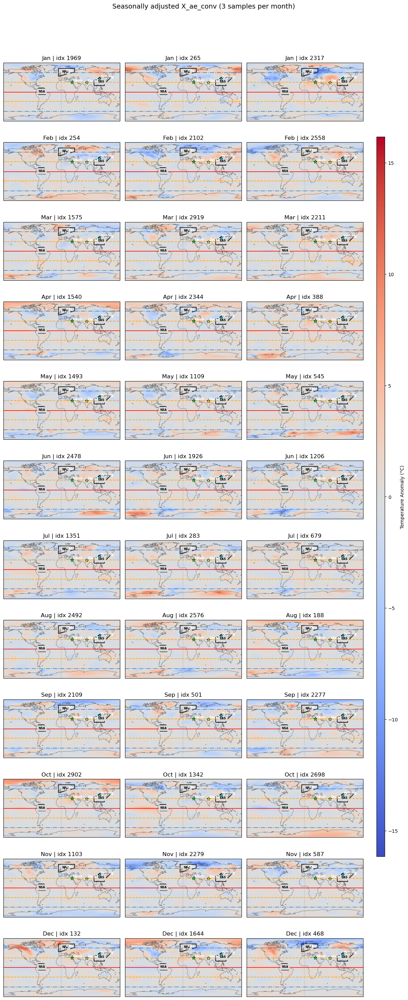

In [14]:
fig = plot_monthly_samples_grid(
    X=X_ae_conv,
    random_indices=random_indices_maps,
    extent=extent,
    month_names=month_names,
    suptitle="Seasonally adjusted X_ae_conv (3 samples per month)",
)
plt.show()


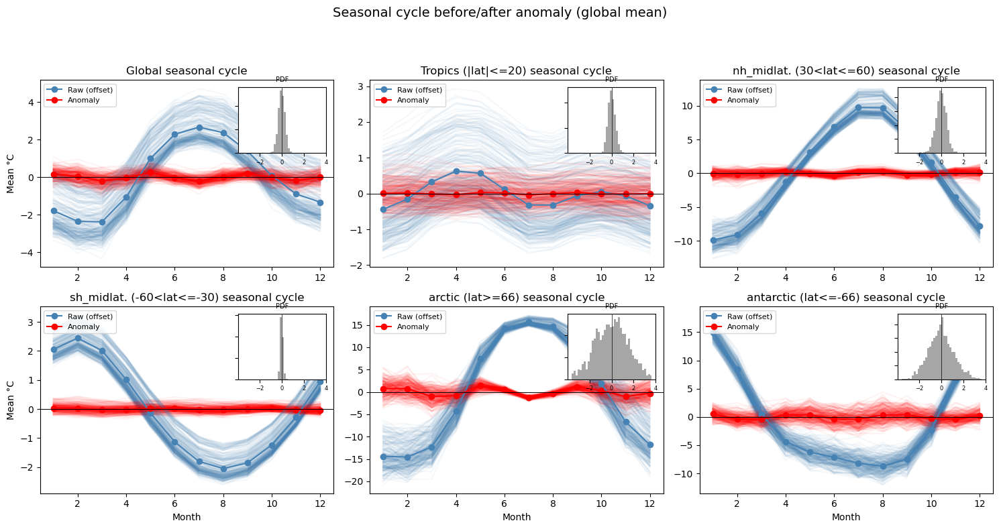

In [15]:
nrows = 2
ncols = np.ceil(len(region_masks) / nrows).astype(int)
seasonal_cycle_fig = seasonal_cycle_before_after(
    X_raw=X_raw,                # (T, 1, n_lat, n_lon)
    X_ae_conv=X_ae_conv,           # (T, 1, n_lat, n_lon)
    month_idx=month_idx,        # length T, values 0..11
    region_masks=region_masks,                  # (n_lat, n_lon) bool
    figtitle="Seasonal cycle before/after anomaly (global mean)",
    units="°C",
    subplot_kwargs={
        "nrows": nrows,
        "ncols": ncols,
        "figsize": (5 * ncols, 4 * nrows),
        "sharey": False
    }
)
plt.show()


* The anomalies after the seasonal harmonics model are larger in high latitudes, (the seasonal cycle is much larger there in general as seen in the time series.
* it is hard to identify any monthly pattern in the anomalies which implies that the removal the seasonal harmonics model har removed alot of the intraannual variability of the model data's mean tendency. As we see from the anomaly lines (spread in the light lines and the PDFs) the internal variability is however still present and it has some seasonality and spatial hetrogenicity - **this is our training objective**!
* To understand further what the seasonal harmonics model is not catching (spatially) we will have a look at some properties:
    * variance
    * Skewness
    * Kurtosis
    * Distributions (hist and QQ-plot)
    * EOF's from a PCA

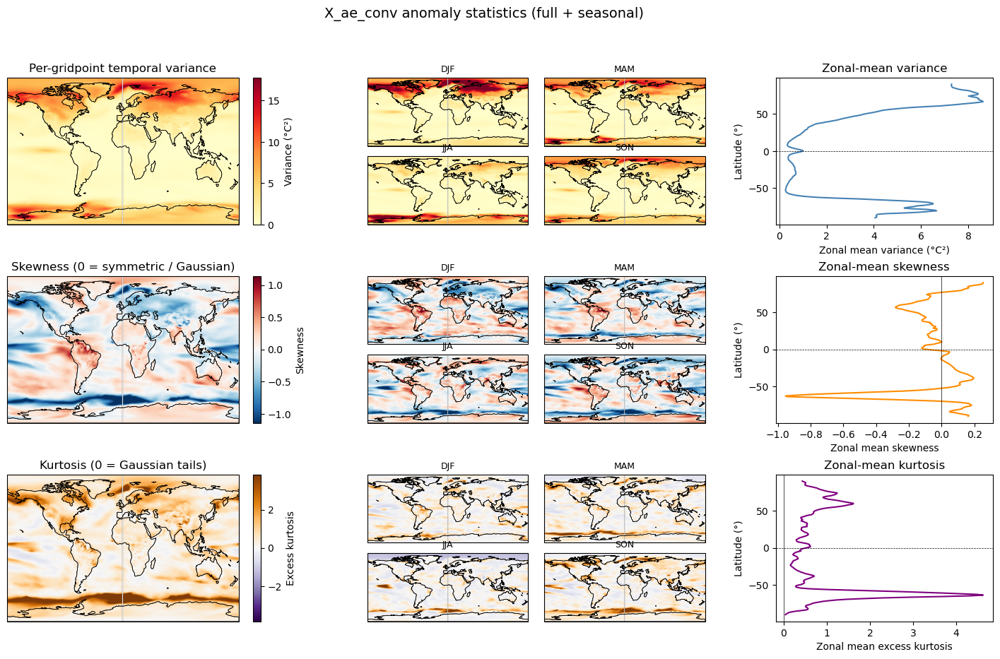

In [16]:
stats_core, fig_core = summarize_anomaly_field_core(
    X_ae_conv=X_ae_conv,
    lats=lats,
    lons=lons,
    extent=extent,
    month_idx=month_idx,
    units="°C",
    title="X_ae_conv anomaly statistics (full + seasonal)",
)
plt.show()


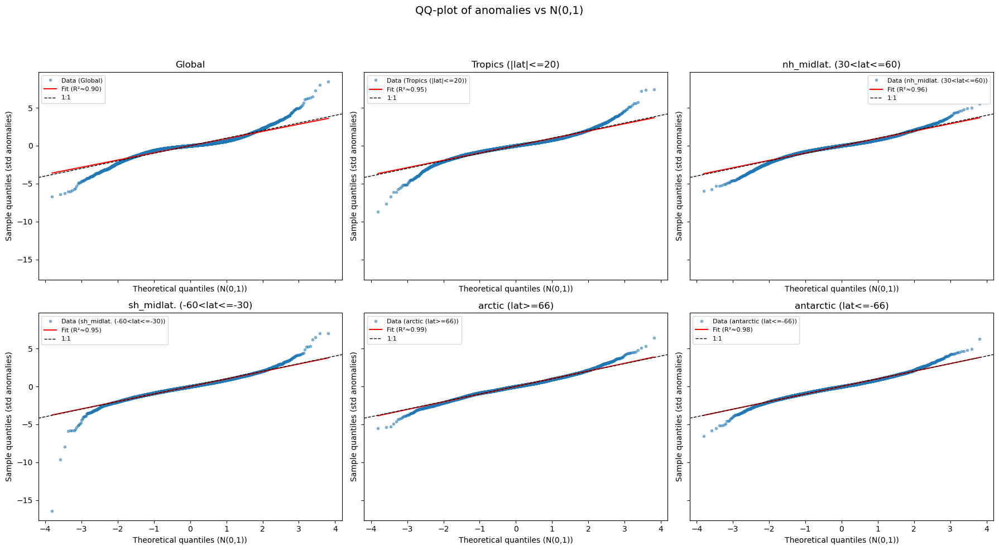

In [17]:
fig_qq = qqplot_anomaly_field(
    X_ae_conv, lats, lons,
    region_masks=region_masks,
    subplot_kwargs={
        "nrows": 2, "ncols": 3, "figsize": (18, 10), "sharex": True, "sharey": True},
)


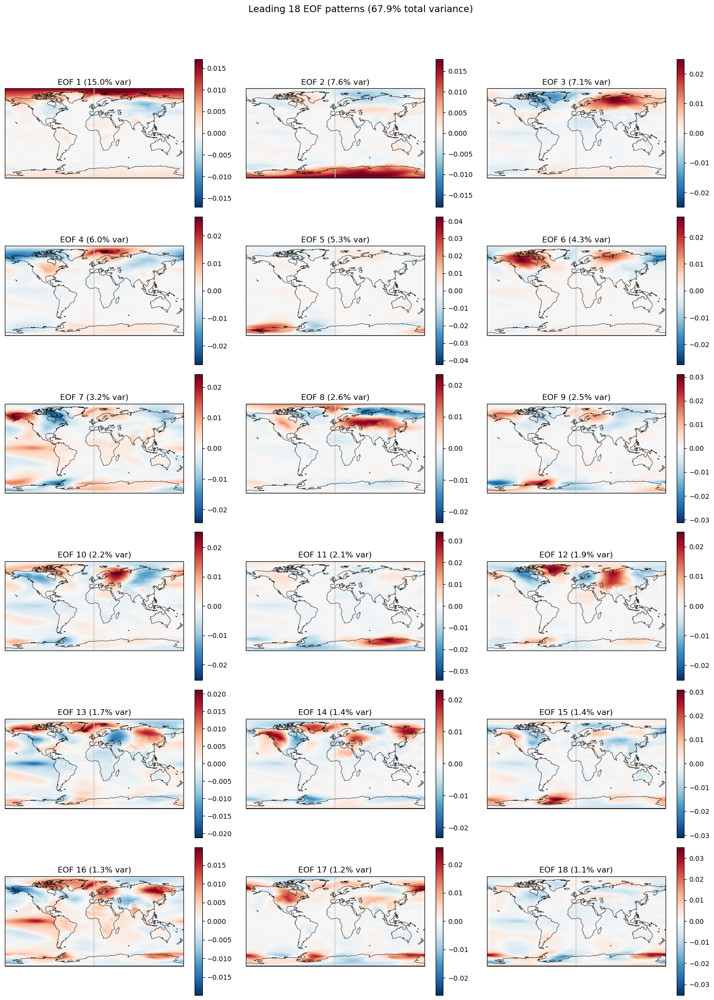

In [18]:
eofs, pcs, var_frac = compute_eofs(X_ae_conv, n_modes=18)
fig_eofs = plot_eof_maps(eofs, var_frac, lats, lons, extent)


* As suspected from the samples plotted above the variance is highest at high latitudes - a low dimensional latent space will likely underfit regions such as the tropics.
* The EOF analysis show that there is not one dominating mode of variability - the EOF's are identifying local modes of variability.

For further interpretation we need to restate what we are looking at. Since we have regressed the gridcells against a smoothed global temperature trend $T_{glob}$ the EOFs are not really catching a global forced trajectory rather they are **departures from globally coherent warming-scaled seasonality**.

### MLP
When we want to use MLP (as opposed to conv. NNs) in the autoencoder `X_ae` has shape `(n_time, n_gridpoints)`. When fitting we treat `n_gridpoints` as a the sample and let `n_time` be the number of samples. To reference features in the anomalies to the spatial pattern (for personal intuition) we see a globe plot of index id with some regions, latitudes, and points (cities) of interest. The grid index is increasing from south to north as seen in the plot.

In [19]:
X_ae = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data=cmip6_data_raw,
    variable_name="tas",
    picontrol_baseline=picontrol_baseline,
    data_type="mlp",  # (n_time, n_lat * n_lon)
)

print(f"X_ae shape : {X_ae.shape}")
print(f"X_ae range : [{X_ae.min():.4f}, {X_ae.max():.4f}]")
print(f"X_ae std   : {X_ae.std():.4f}")

X_ae shape : (3012, 55296)
X_ae range : [-20.3367, 19.9445]
X_ae std   : 1.7117


Latitude band flat-index ranges:
  Eq. (0°)    (actual -0.471°)  →  cols  27360 …  27647
  +30°        (actual +29.686°)  →  cols  36576 …  36863
  −30°        (actual -29.686°)  →  cols  18432 …  18719
  +60°        (actual +59.843°)  →  cols  45792 …  46079
  −60°        (actual -59.843°)  →  cols   9216 …   9503

City flat indices:
  Oslo      lat=+59.843°  lon=+11.250°  →  idx  45801
  Delhi     lat=+28.743°  lon=+77.500°  →  idx  36350
  Cairo     lat=+29.686°  lon=+31.250°  →  idx  36601
  Beijing   lat=+40.052°  lon=+116.250°  →  idx  39837


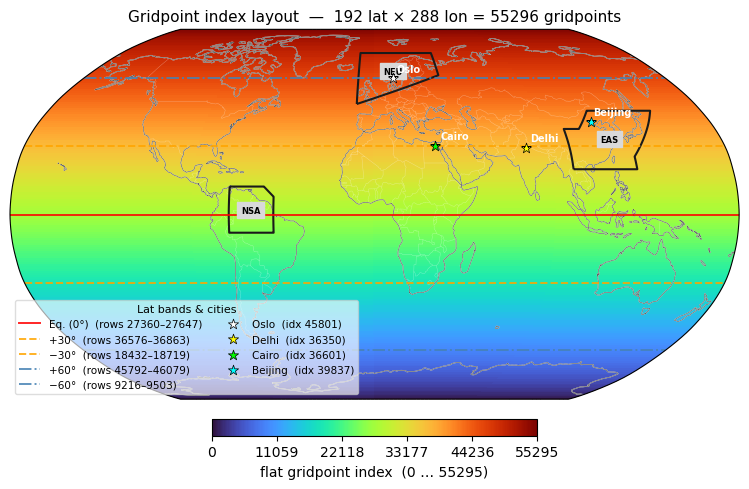

In [20]:
# lat/lon grid comes from the raw CMIP6 dataset
assert n_pts == X_ae.shape[1], f"Grid mismatch: {n_pts} vs {X_ae.shape[1]}"

# The flat index increases left-to-right, top-to-bottom,
# matching xr.stack(space=('lat', 'lon')).
idx_grid = np.arange(n_pts).reshape(n_lat, n_lon)

print("Latitude band flat-index ranges:")
for label, b in lat_bands.items():
    print(f"  {label:10s}  (actual {b['actual_lat']:+.3f}°)  →  cols {b['flat_start']:>6d} … {b['flat_end']:>6d}")
print("\nCity flat indices:")
for cname, c in city_flat.items():
    print(f"  {cname:<8s}  lat={c['actual_lat']:+.3f}°  lon={c['actual_lon']:+.3f}°  →  idx {c['flat_idx']:>6d}")

# ── Globe plot ──────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
ax.set_global()

im = ax.pcolormesh(
    lons, lats, idx_grid,
    cmap="turbo",
    vmin=0, vmax=n_pts - 1,
    transform=ccrs.PlateCarree(),
    rasterized=True,
)
ax.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor="white")
ax.add_feature(cfeature.BORDERS,   linewidth=0.3, edgecolor="white", alpha=0.4)

# Regions from AR6 (for reference, not exact boundaries)
ar6.all[list(region_names.keys())].plot(
    ax=ax,
    add_ocean=False,
    text_kws={"fontsize": 6, "fontweight": "bold"},
    label="abbrev"
)

# Latitude band lines
for label, b in lat_bands.items():
    lat_val = b["actual_lat"]
    ax.plot(
        [-179.9, 179.9], [lat_val, lat_val],
        transform=ccrs.PlateCarree(),
        color=b["color"], lw=1.4, ls=b["ls"], alpha=0.85,
        label=f"{label}  (rows {b['flat_start']}–{b['flat_end']})",
    )

# City markers
city_colors = ["white", "yellow", "lime", "cyan"]
for (cname, c), marker_color in zip(city_flat.items(), city_colors):
    ax.scatter(
        c["actual_lon"], c["actual_lat"],
        transform=ccrs.PlateCarree(),
        s=60, marker="*", color=marker_color, edgecolors="black", lw=0.5, zorder=5,
        label=f"{cname}  (idx {c['flat_idx']})",
    )
    ax.text(
        c["actual_lon"] + 3, c["actual_lat"] + 3, cname,
        transform=ccrs.PlateCarree(),
        fontsize=7, color="white", fontweight="bold",
        clip_on=True,
    )

cb = plt.colorbar(im, ax=ax, orientation="horizontal", pad=0.05, fraction=0.04, shrink=0.8)
cb.set_label(f"flat gridpoint index  (0 … {n_pts - 1})", fontsize=10)
cb.set_ticks(np.linspace(0, n_pts - 1, 6, dtype=int))

ax.legend(
    loc="lower left", fontsize=7.5, framealpha=0.65,
    title="Lat bands & cities", title_fontsize=8,
    ncol=2,
)
ax.set_title(
    f"Gridpoint index layout  —  {n_lat} lat × {n_lon} lon = {n_pts} gridpoints",
    fontsize=11,
)
plt.tight_layout()
plt.show()


In [21]:
random_indices_flat = RNG.choice(int(X_ae.shape[0]), size=5, replace=False)

Randomly selected indices for testing: [1103 2774 1237 2913 2240]


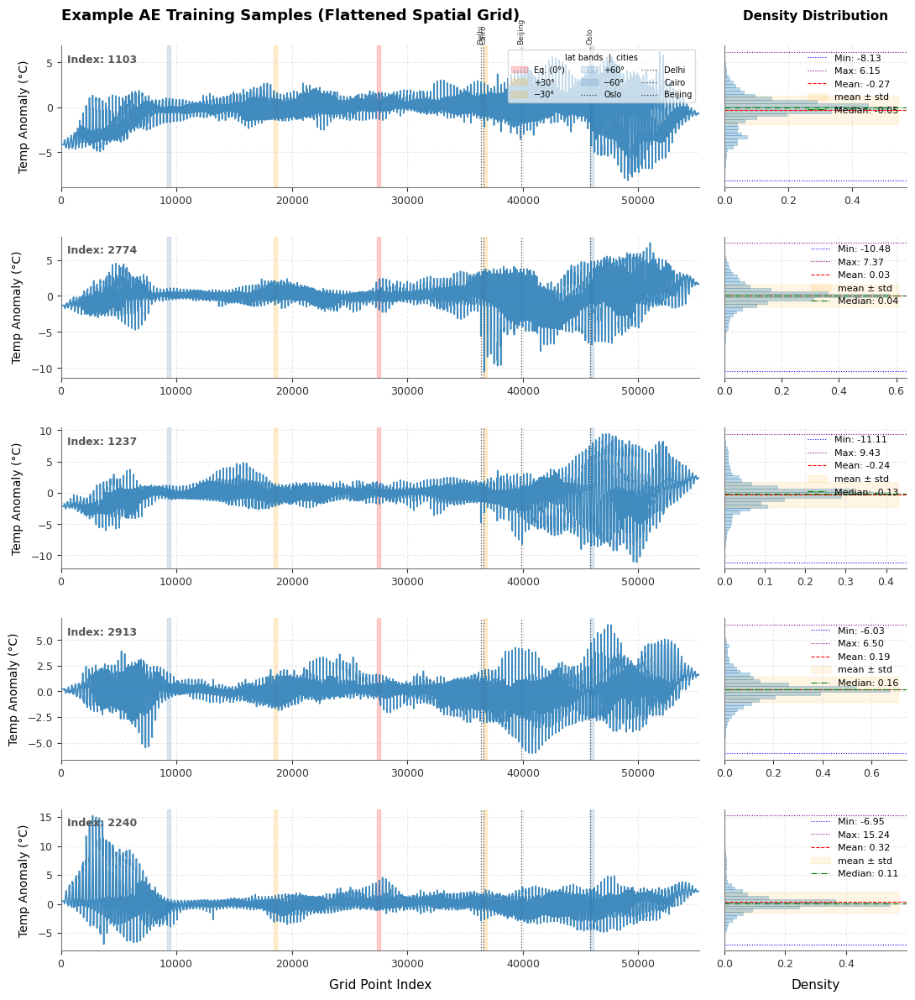

In [22]:
print(f"Randomly selected indices for testing: {random_indices_flat}")

nrows = len(random_indices_flat)

fig = plt.figure(figsize=(13, 2.8 * nrows), facecolor='#ffffff')
gs = GridSpec(nrows=nrows, ncols=2, width_ratios=[3.5, 1], wspace=0.06, hspace=0.35)

for ax_idx, test_idx in enumerate(random_indices_flat):

    test_sample = X_ae[test_idx, :]

    # ── Left axis: line plot ────────────────────────────────────────────────
    ax_line = fig.add_subplot(gs[ax_idx, 0])
    ax_line.plot(test_sample, color='#1f77b4', linewidth=1.2, alpha=0.85, zorder=3)

    # Latitude band vertical fills
    for label, b in lat_bands.items():
        ax_line.axvspan(
            b["flat_start"], b["flat_end"],
            alpha=0.18, color=b["color"], zorder=1,
            label=label if ax_idx == 0 else "_nolegend_",
        )

    # City vertical lines
    for cname, c in city_flat.items():
        ax_line.axvline(
            c["flat_idx"], color="black", lw=0.9, ls=":", alpha=0.7, zorder=2,
            label=cname if ax_idx == 0 else "_nolegend_",
        )
        if ax_idx == 0:
            ax_line.text(
                c["flat_idx"], 1.01, cname,
                transform=ax_line.get_xaxis_transform(),
                rotation=90, va="bottom", ha="center",
                fontsize=6.5, color="#333333",
            )

    if ax_idx == 0:
        ax_line.set_title('Example AE Training Samples (Flattened Spatial Grid)', fontsize=13, fontweight='bold', pad=22, loc='left')
        ax_line.legend(loc="upper right", fontsize=7, framealpha=0.7, ncol=3,
                       title="lat bands  |  cities", title_fontsize=7)
    if ax_idx == nrows - 1:
        ax_line.set_xlabel('Grid Point Index', fontsize=11, labelpad=8)

    ax_line.set_ylabel('Temp Anomaly (°C)', fontsize=10, labelpad=6)
    ax_line.grid(True, linestyle='--', alpha=0.4, color='#cccccc', zorder=0)
    ax_line.set_xlim(0, len(test_sample))
    ax_line.text(0.01, 0.88, f"Index: {test_idx}", transform=ax_line.transAxes,
                 fontsize=9, fontweight='semibold', color='#555555')

    # ── Right axis: density histogram ──────────────────────────────────────
    ax_hist = fig.add_subplot(gs[ax_idx, 1], sharey=ax_line)
    ax_hist.hist(test_sample, bins=40, density=True, orientation='horizontal',
                color='#1f77b4', alpha=0.3, edgecolor='#1f77b4', linewidth=0.6)
    mean_val   = test_sample.mean()
    median_val = np.median(test_sample)
    min_val    = test_sample.min()
    max_val    = test_sample.max()
    std_val    = test_sample.std()
    ax_hist.axhline(min_val,    color='blue',   linestyle=':',  linewidth=0.8, label=f'Min: {min_val:.2f}')
    ax_hist.axhline(max_val,    color='purple', linestyle=':',  linewidth=0.8, label=f'Max: {max_val:.2f}')
    ax_hist.axhline(mean_val,   color='red',    linestyle='--', linewidth=0.8, label=f'Mean: {mean_val:.2f}')
    ax_hist.fill_betweenx([mean_val + std_val, mean_val - std_val], 0, ax_hist.get_xlim()[1],
                          color='orange', alpha=0.1, label='mean ± std')
    ax_hist.axhline(median_val, color='green',  linestyle='-.', linewidth=0.8, label=f'Median: {median_val:.2f}')
    ax_hist.legend(loc='upper right', fontsize=8, frameon=False)

    if ax_idx == 0:
        ax_hist.set_title('Density Distribution', fontsize=11, fontweight='semibold', pad=22)
    if ax_idx == nrows - 1:
        ax_hist.set_xlabel('Density', fontsize=11, labelpad=8)

    ax_hist.grid(True, linestyle='--', alpha=0.4, color='#cccccc')
    plt.setp(ax_hist.get_yticklabels(), visible=False)
    ax_hist.yaxis.set_tick_params(left=False)

    for ax in [ax_line, ax_hist]:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_color('#777777')
        ax.spines['bottom'].set_color('#777777')
        ax.tick_params(colors='#333333', labelsize=9)

plt.show()


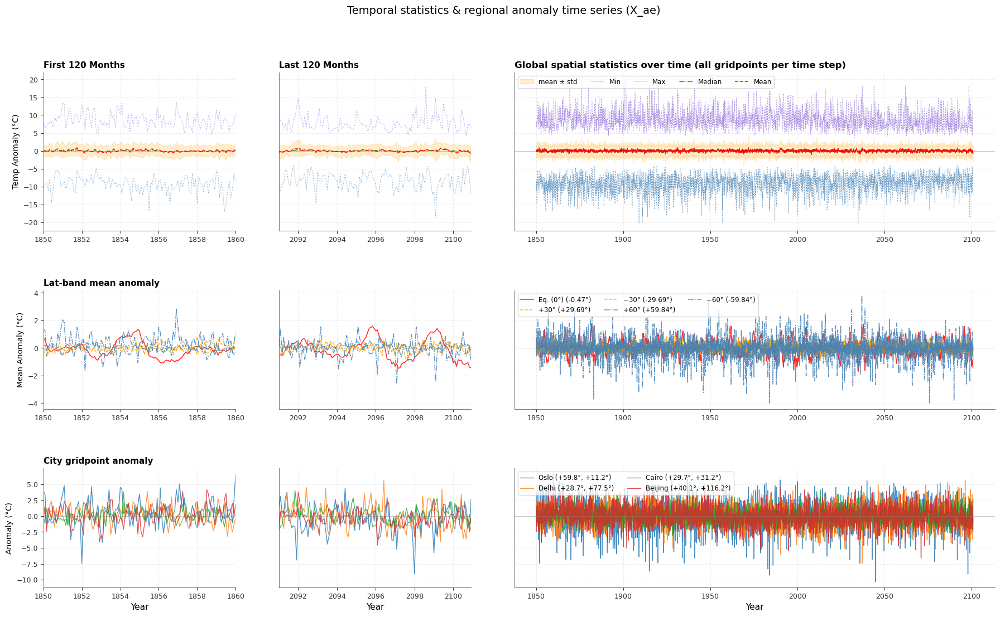

In [23]:
ts_stats, band_ts, city_ts = compute_temporal_stats_from_flat(
    X_ae=X_ae,
    lat_bands=lat_bands,
    city_flat=city_flat,
)

# 2. Define a numeric time axis t_num (example: years since 1850)
# If you have an xarray time coordinate, use its values converted to years:
# time = cmip6_data_raw['time'].values
# t_num = (time.astype('datetime64[M]').astype(int) / 12) + 1850
T = X_ae.shape[0]
t_num = 1850 + np.arange(T) / 12  # assuming monthly data starting Jan 1850

# 3. Plot
fig_temporal = plot_temporal_structure_flat(
    t_num=t_num,
    ts_stats=ts_stats,
    band_ts=band_ts,
    city_ts=city_ts,
    lat_bands=lat_bands,
    city_flat=city_flat,
    units="°C",
    zoom_len=120,
    title="Temporal statistics & regional anomaly time series (X_ae)",
)
plt.show()


## pr

In [24]:
X_ae = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data=cmip6_data_raw,
    variable_name="pr",
    picontrol_baseline=picontrol_baseline,
    data_type="mlp",  # (n_time, n_lat * n_lon)
)
X_ae_conv = AEVARXNoiseModel.prepare_training_data_for_AE(
    monthly_data=cmip6_data_raw,
    variable_name="pr",
    picontrol_baseline=picontrol_baseline,
    data_type="conv",  # (n_time, n_lat, n_lon)
)

X_raw = cmip6_data_raw["pr"].isel(ens=0).values[:, np.newaxis, :, :]  # (T, 1, n_lat, n_lon)
print(f"X_ae_conv shape : {X_ae_conv.shape}")
print(f"X_ae_conv range : [{X_ae_conv.min():.4f}, {X_ae_conv.max():.4f}]")
print(f"X_ae_conv std   : {X_ae_conv.std():.4f}")


X_ae_conv shape : (3012, 1, 192, 288)
X_ae_conv range : [-0.0003, 0.0010]
X_ae_conv std   : 0.0000


### conv.

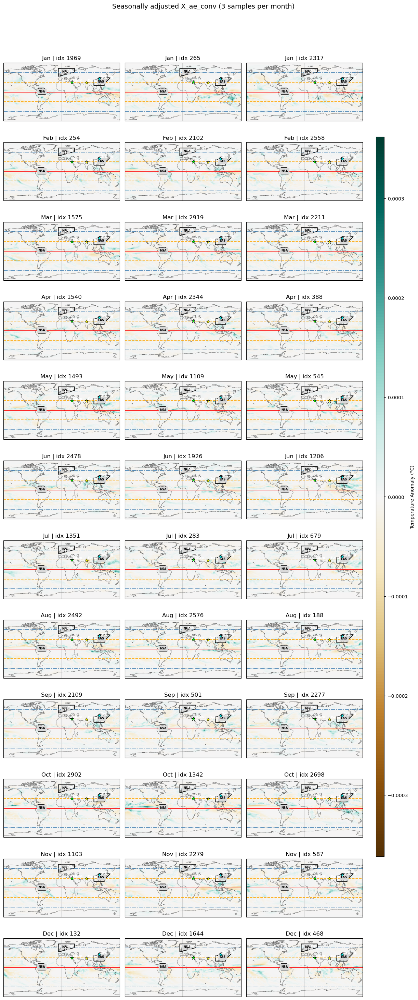

In [25]:
fig = plot_monthly_samples_grid(
    X=X_ae_conv,
    random_indices=random_indices_maps,
    extent=extent,
    month_names=month_names,
    cmap="BrBG",
    suptitle="Seasonally adjusted X_ae_conv (3 samples per month)",
)
plt.show()


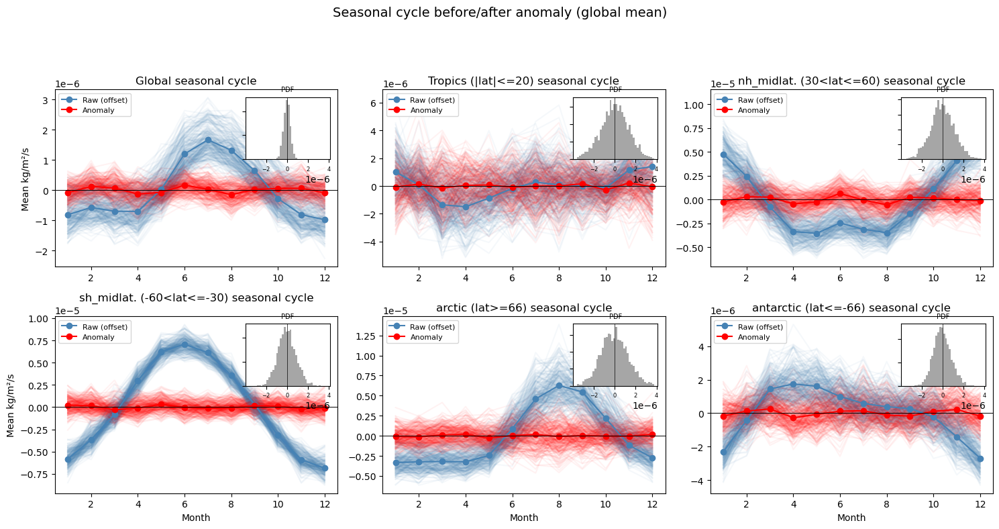

In [32]:
nrows = 2
ncols = np.ceil(len(region_masks) / nrows).astype(int)
seasonal_cycle_fig = seasonal_cycle_before_after(
    X_raw=X_raw,                # (T, 1, n_lat, n_lon)
    X_ae_conv=X_ae_conv,           # (T, 1, n_lat, n_lon)
    month_idx=month_idx,        # length T, values 0..11
    region_masks=region_masks,                  # (n_lat, n_lon) bool
    figtitle="Seasonal cycle before/after anomaly (global mean)",
    units="kg/m²/s",
    subplot_kwargs={
        "nrows": nrows,
        "ncols": ncols,
        "figsize": (5 * ncols, 4 * nrows),
        "sharey": False
    }
)
plt.show()


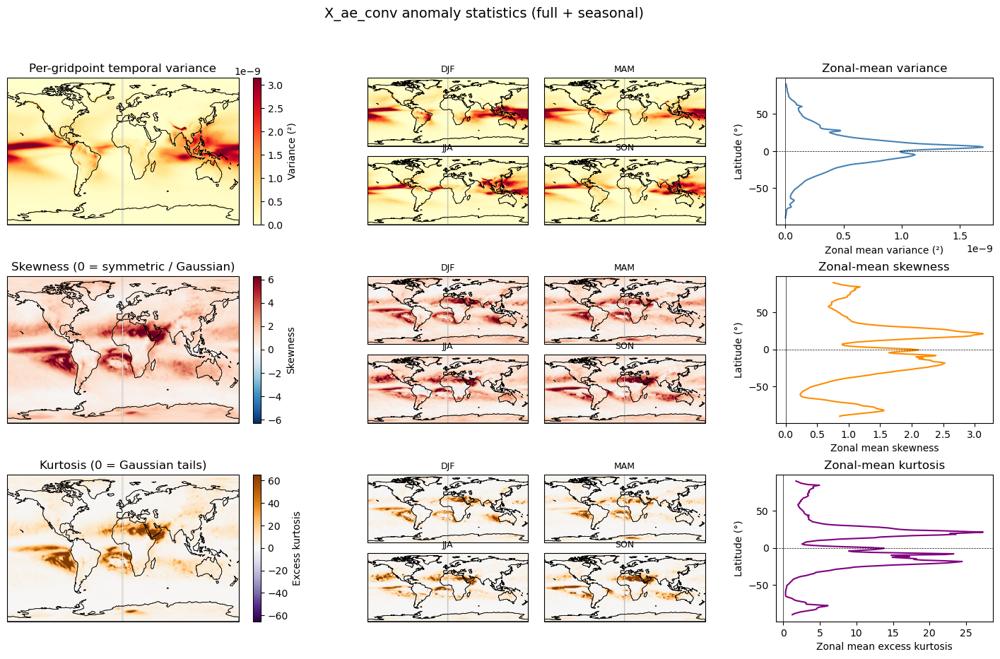

In [34]:
stats_core, fig_core = summarize_anomaly_field_core(
    X_ae_conv=X_ae_conv,
    lats=lats,
    lons=lons,
    extent=extent,
    month_idx=month_idx,
    units="",
    title="X_ae_conv anomaly statistics (full + seasonal)",
)
plt.show()


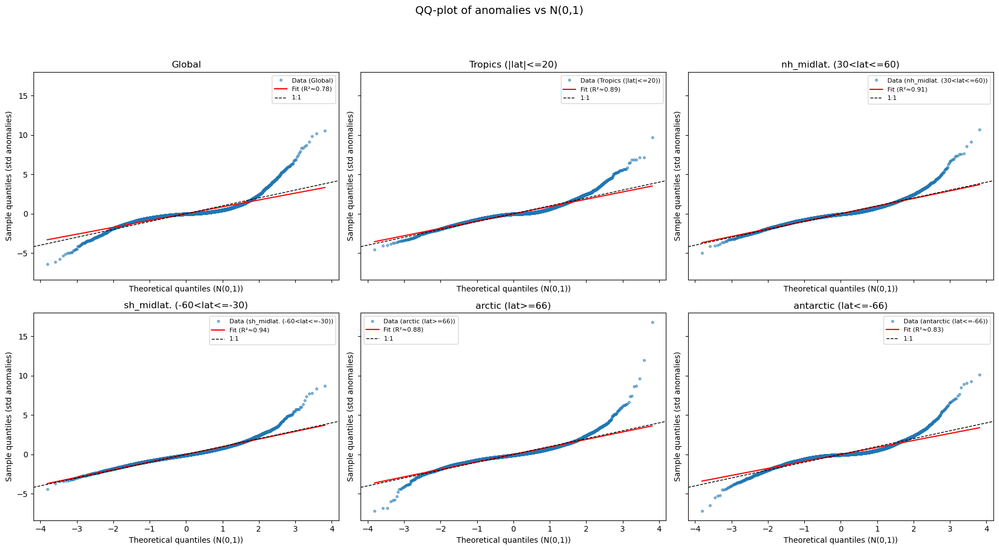

In [35]:
fig_qq = qqplot_anomaly_field(
    X_ae_conv, lats, lons,
    region_masks=region_masks,
    subplot_kwargs={
        "nrows": 2, "ncols": 3, "figsize": (18, 10), "sharex": True, "sharey": True},
)


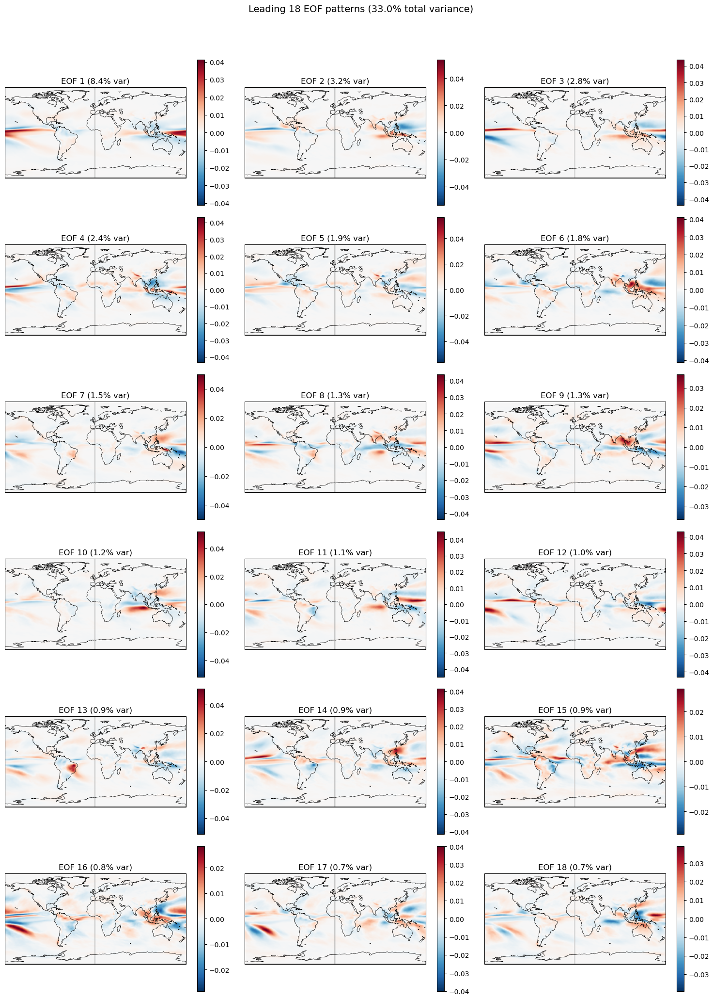

In [29]:
eofs, pcs, var_frac = compute_eofs(X_ae_conv, n_modes=18)
fig_eofs = plot_eof_maps(eofs, var_frac, lats, lons, extent)


### MLP

Randomly selected indices for testing: [1103 2774 1237 2913 2240]


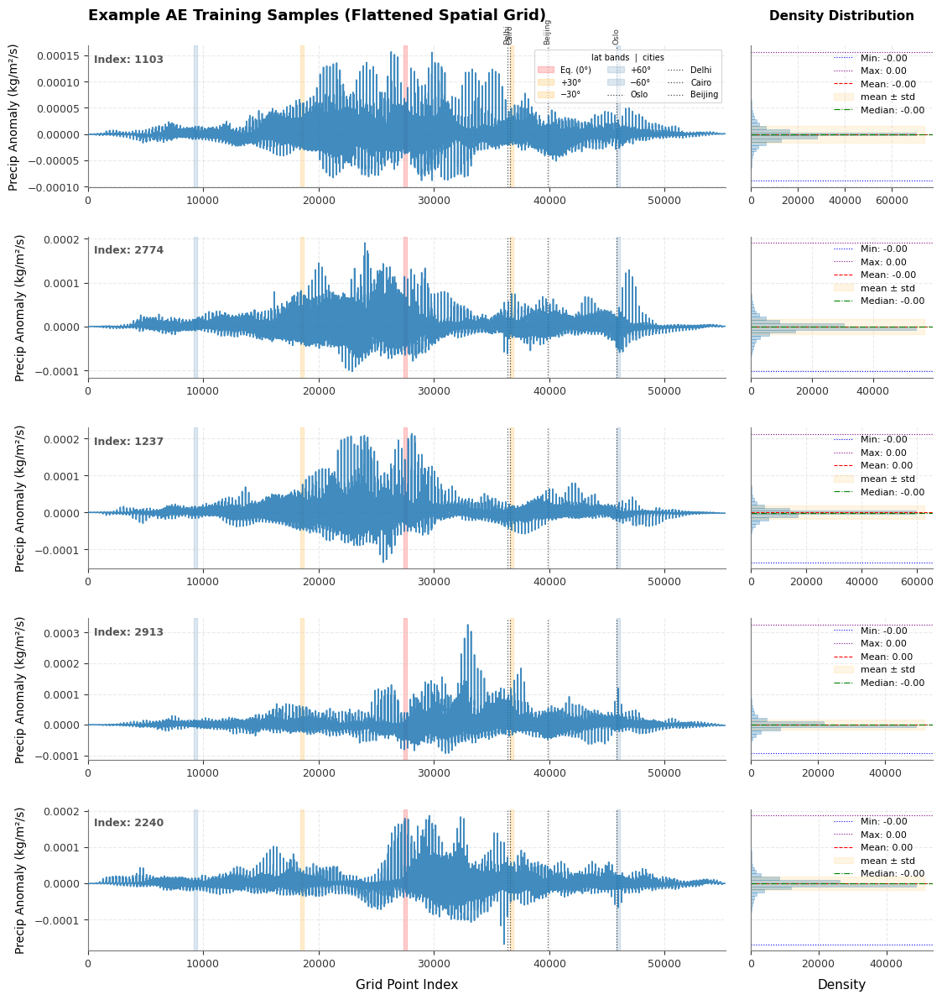

In [36]:
print(f"Randomly selected indices for testing: {random_indices_flat}")

nrows = len(random_indices_flat)

fig = plt.figure(figsize=(13, 2.8 * nrows), facecolor='#ffffff')
gs = GridSpec(nrows=nrows, ncols=2, width_ratios=[3.5, 1], wspace=0.06, hspace=0.35)

for ax_idx, test_idx in enumerate(random_indices_flat):

    test_sample = X_ae[test_idx, :]

    # ── Left axis: line plot ────────────────────────────────────────────────
    ax_line = fig.add_subplot(gs[ax_idx, 0])
    ax_line.plot(test_sample, color='#1f77b4', linewidth=1.2, alpha=0.85, zorder=3)

    # Latitude band vertical fills
    for label, b in lat_bands.items():
        ax_line.axvspan(
            b["flat_start"], b["flat_end"],
            alpha=0.18, color=b["color"], zorder=1,
            label=label if ax_idx == 0 else "_nolegend_",
        )

    # City vertical lines
    for cname, c in city_flat.items():
        ax_line.axvline(
            c["flat_idx"], color="black", lw=0.9, ls=":", alpha=0.7, zorder=2,
            label=cname if ax_idx == 0 else "_nolegend_",
        )
        if ax_idx == 0:
            ax_line.text(
                c["flat_idx"], 1.01, cname,
                transform=ax_line.get_xaxis_transform(),
                rotation=90, va="bottom", ha="center",
                fontsize=6.5, color="#333333",
            )

    if ax_idx == 0:
        ax_line.set_title('Example AE Training Samples (Flattened Spatial Grid)', fontsize=13, fontweight='bold', pad=22, loc='left')
        ax_line.legend(loc="upper right", fontsize=7, framealpha=0.7, ncol=3,
                       title="lat bands  |  cities", title_fontsize=7)
    if ax_idx == nrows - 1:
        ax_line.set_xlabel('Grid Point Index', fontsize=11, labelpad=8)

    ax_line.set_ylabel('Precip Anomaly (kg/m²/s)', fontsize=10, labelpad=6)
    ax_line.grid(True, linestyle='--', alpha=0.4, color='#cccccc', zorder=0)
    ax_line.set_xlim(0, len(test_sample))
    ax_line.text(0.01, 0.88, f"Index: {test_idx}", transform=ax_line.transAxes,
                 fontsize=9, fontweight='semibold', color='#555555')

    # ── Right axis: density histogram ──────────────────────────────────────
    ax_hist = fig.add_subplot(gs[ax_idx, 1], sharey=ax_line)
    ax_hist.hist(test_sample, bins=40, density=True, orientation='horizontal',
                color='#1f77b4', alpha=0.3, edgecolor='#1f77b4', linewidth=0.6)
    mean_val   = test_sample.mean()
    median_val = np.median(test_sample)
    min_val    = test_sample.min()
    max_val    = test_sample.max()
    std_val    = test_sample.std()
    ax_hist.axhline(min_val,    color='blue',   linestyle=':',  linewidth=0.8, label=f'Min: {min_val:.2f}')
    ax_hist.axhline(max_val,    color='purple', linestyle=':',  linewidth=0.8, label=f'Max: {max_val:.2f}')
    ax_hist.axhline(mean_val,   color='red',    linestyle='--', linewidth=0.8, label=f'Mean: {mean_val:.2f}')
    ax_hist.fill_betweenx([mean_val + std_val, mean_val - std_val], 0, ax_hist.get_xlim()[1],
                          color='orange', alpha=0.1, label='mean ± std')
    ax_hist.axhline(median_val, color='green',  linestyle='-.', linewidth=0.8, label=f'Median: {median_val:.2f}')
    ax_hist.legend(loc='upper right', fontsize=8, frameon=False)

    if ax_idx == 0:
        ax_hist.set_title('Density Distribution', fontsize=11, fontweight='semibold', pad=22)
    if ax_idx == nrows - 1:
        ax_hist.set_xlabel('Density', fontsize=11, labelpad=8)

    ax_hist.grid(True, linestyle='--', alpha=0.4, color='#cccccc')
    plt.setp(ax_hist.get_yticklabels(), visible=False)
    ax_hist.yaxis.set_tick_params(left=False)

    for ax in [ax_line, ax_hist]:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_color('#777777')
        ax.spines['bottom'].set_color('#777777')
        ax.tick_params(colors='#333333', labelsize=9)

plt.show()


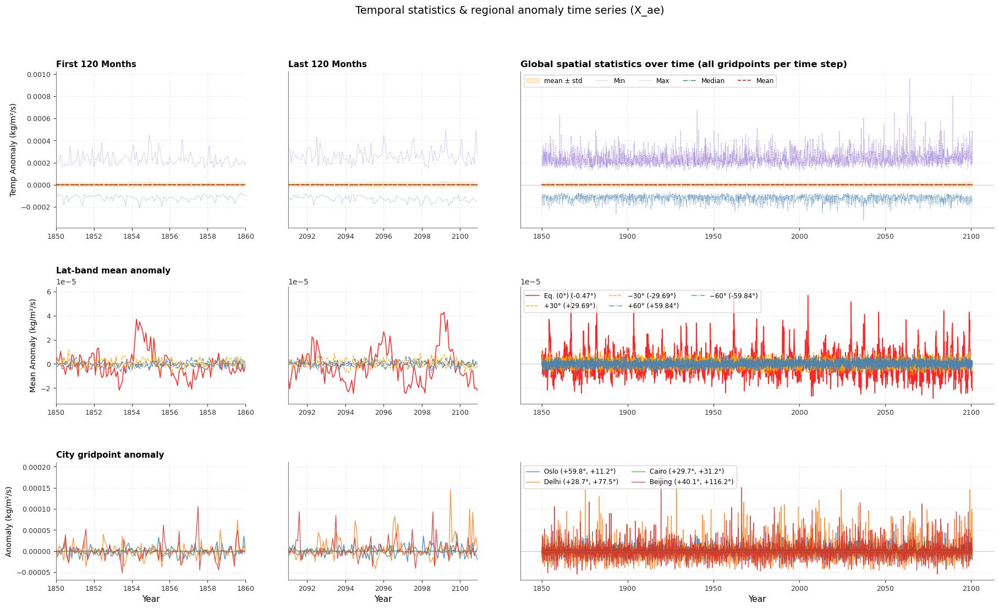

In [37]:
ts_stats, band_ts, city_ts = compute_temporal_stats_from_flat(
    X_ae=X_ae,
    lat_bands=lat_bands,
    city_flat=city_flat,
)

# 2. Define a numeric time axis t_num (example: years since 1850)
# If you have an xarray time coordinate, use its values converted to years:
# time = cmip6_data_raw['time'].values
# t_num = (time.astype('datetime64[M]').astype(int) / 12) + 1850
T = X_ae.shape[0]
t_num = 1850 + np.arange(T) / 12  # assuming monthly data starting Jan 1850

# 3. Plot
fig_temporal = plot_temporal_structure_flat(
    t_num=t_num,
    ts_stats=ts_stats,
    band_ts=band_ts,
    city_ts=city_ts,
    lat_bands=lat_bands,
    city_flat=city_flat,
    units="kg/m²/s",
    zoom_len=120,
    title="Temporal statistics & regional anomaly time series (X_ae)",
)
plt.show()
